In [14]:
import torch
import torch.optim as opt
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from PIL import Image
import numpy as np
import pathlib

In [27]:
def imshow(imgs, epoch):
    imgs = torchvision.utils.make_grid(imgs, nrow=10)
    npimgs = imgs.numpy()
    plt.figure(figsize=(8,8))
    plt.imshow(np.transpose(npimgs, (1,2,0)), cmap='gray')
    plt.xticks([])
    plt.yticks([])
    name = str(epoch) + ".png"
    plt.savefig(name)
    plt.show()

In [28]:
def load_data(root_folder):
    image_size = (32, 32)
    dataset = torchvision.datasets.ImageFolder(root=root_folder,
                                               transform = transforms.Compose([transforms.Resize(image_size),
                                                transforms.CenterCrop(image_size),
                                                transforms.ToTensor()]))
    cars_data = []
    for i in range(len(dataset.targets)):
        if dataset.targets[i] == 1:
            cars_data.append(i)

    train_loader = torch.utils.data.DataLoader(dataset, batch_size=16, shuffle=False, 
                                                sampler = torch.utils.data.sampler.SubsetRandomSampler(cars_data))
    return train_loader

source_folder = "/home/swapnil/Desktop/IE643_Assignment_4/natural_images/"
train_loader = load_data(source_folder)

In [29]:
nc = 3    # Number of channels in the training images. For color images this is 3
nz = 100  # Size of z latent vector (i.e. size of generator input)
ngf = 64  # Size of feature maps in generator
ndf = 64  # Size of feature maps in discriminator
# Batch_size = 16

#Discriminator Code
class DC_Dis(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            # input is 3 x 32 x 32
            nn.Conv2d(nc, ndf, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 16 x 16
            nn.Conv2d(ndf, ndf * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 8 x 8
            nn.Conv2d(ndf * 2, ndf * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 4 x 4
            #nn.Conv2d(ndf * 4, ndf * 8, kernel_size=4, stride=2, padding=1, bias=False),
            #nn.BatchNorm2d(ndf * 8),
            #nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 4, 1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.model(input)

# Generator Code
class DC_Gen(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(nz, ngf * 4, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 4, ngf * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 2, ngf, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            #nn.ConvTranspose2d( ngf * 2, ngf, kernel_size=4, stride=2, padding=1, bias=False),
            #nn.BatchNorm2d(ngf),
            #nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.model(input)

In [30]:
G = DC_Gen()
D = DC_Dis()

lr = 1e-3  #learning rate
#optimizers for both models
g_opt = opt.Adam(G.parameters(), lr=lr)
d_opt = opt.Adam(D.parameters(), lr=lr)

In [31]:
G_loss_epoch = []
D_loss_epoch = []

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:0,   G_loss:7.724139838922219,    D_loss:0.2339784103506779


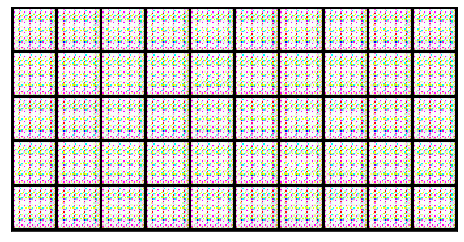

Epoch:1,   G_loss:7.617683480997554,    D_loss:0.022624828150404282
Epoch:2,   G_loss:9.860630387165507,    D_loss:0.14010327688662133
Epoch:3,   G_loss:5.878222723476222,    D_loss:0.1900918839697833
Epoch:4,   G_loss:7.928411999686819,    D_loss:0.09871702302356067
Epoch:5,   G_loss:11.167385961188645,    D_loss:0.04877368368391619
Epoch:6,   G_loss:10.315249419603191,    D_loss:0.030216860146925893
Epoch:7,   G_loss:8.903620321242535,    D_loss:0.13901811148818644
Epoch:8,   G_loss:9.217297233519007,    D_loss:0.11470321699648668
Epoch:9,   G_loss:12.925410786613089,    D_loss:0.11186770487029953


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:10,   G_loss:9.063109741836298,    D_loss:0.05367687410965073


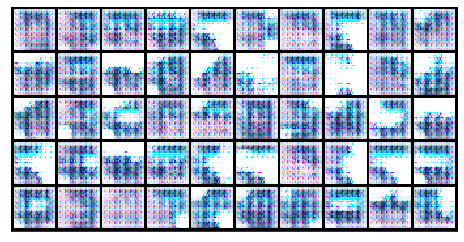

Epoch:11,   G_loss:10.702953745107182,    D_loss:0.12863767861682524
Epoch:12,   G_loss:8.8361192531273,    D_loss:0.048897151718608894
Epoch:13,   G_loss:11.10749502651027,    D_loss:0.2840952918118464
Epoch:14,   G_loss:9.067918425700704,    D_loss:0.1310360444200103
Epoch:15,   G_loss:7.8686344740820715,    D_loss:0.2047953403432716
Epoch:16,   G_loss:9.996669421430495,    D_loss:0.5118037765715882
Epoch:17,   G_loss:7.252043583354012,    D_loss:0.31846516245602036
Epoch:18,   G_loss:6.951500576050555,    D_loss:0.2739605724536737
Epoch:19,   G_loss:6.9750730170578255,    D_loss:0.3717369278205834


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:20,   G_loss:6.19913818210852,    D_loss:0.2522183161564782


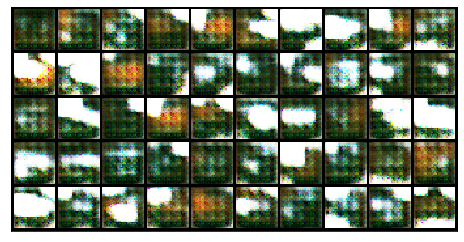

Epoch:21,   G_loss:6.266404874989243,    D_loss:0.38375423268460834
Epoch:22,   G_loss:6.302768124908697,    D_loss:0.3070690931111086
Epoch:23,   G_loss:5.912539294508637,    D_loss:0.2656223999305827
Epoch:24,   G_loss:6.705345695136024,    D_loss:0.25018020662036344
Epoch:25,   G_loss:6.055149043192629,    D_loss:0.2230947365465223
Epoch:26,   G_loss:6.752935479898921,    D_loss:0.27700646829287534
Epoch:27,   G_loss:6.31919300751608,    D_loss:0.1416363701010581
Epoch:28,   G_loss:6.244760153723544,    D_loss:0.18891285022445878
Epoch:29,   G_loss:7.182584727396731,    D_loss:0.25018495247989403


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:30,   G_loss:7.5804562099644395,    D_loss:0.3175061526708305


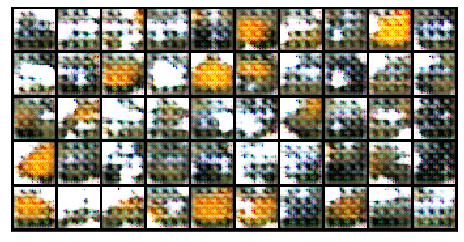

Epoch:31,   G_loss:6.996758894842179,    D_loss:0.3631171669322448
Epoch:32,   G_loss:6.085784020971079,    D_loss:0.3565200827405101
Epoch:33,   G_loss:6.571755917345891,    D_loss:0.2726349391531749
Epoch:34,   G_loss:6.977326854330594,    D_loss:0.38759075038012913
Epoch:35,   G_loss:6.564207518687014,    D_loss:0.2764452746840286
Epoch:36,   G_loss:6.147444556971065,    D_loss:0.30869090169301777
Epoch:37,   G_loss:6.060494970102779,    D_loss:0.21374502196358364
Epoch:38,   G_loss:6.652669249987993,    D_loss:0.2785415650177442
Epoch:39,   G_loss:6.857622302946497,    D_loss:0.3193752651912023


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:40,   G_loss:5.07909429855034,    D_loss:0.39563237759666364


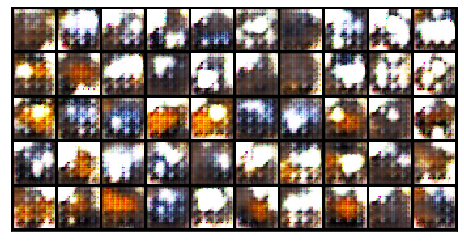

Epoch:41,   G_loss:5.1456370725006355,    D_loss:0.37034355473445085
Epoch:42,   G_loss:6.20042179060764,    D_loss:0.24993549468240045
Epoch:43,   G_loss:7.291300783391859,    D_loss:0.4951569621955029
Epoch:44,   G_loss:5.74501594559091,    D_loss:0.3911090816569621
Epoch:45,   G_loss:5.463633091723333,    D_loss:0.28677594970117826
Epoch:46,   G_loss:5.647569273338943,    D_loss:0.19116287837263013
Epoch:47,   G_loss:5.879068753758415,    D_loss:0.36995925277960107
Epoch:48,   G_loss:5.72083586356679,    D_loss:0.2612953263289127
Epoch:49,   G_loss:5.709620796266149,    D_loss:0.2576354433034287


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:50,   G_loss:6.01505425523539,    D_loss:0.24122678033518988


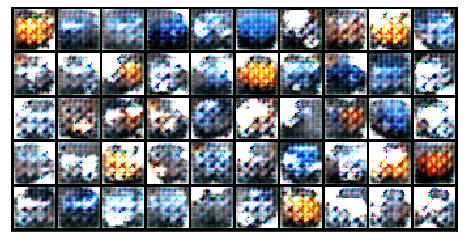

Epoch:51,   G_loss:6.245442550690448,    D_loss:0.32123244520215716
Epoch:52,   G_loss:6.236265616338761,    D_loss:0.40480688058572717
Epoch:53,   G_loss:5.933251361377904,    D_loss:0.35751660778874256
Epoch:54,   G_loss:5.952510407713593,    D_loss:0.3140246682479733
Epoch:55,   G_loss:5.6781790295585255,    D_loss:0.2621634781711781
Epoch:56,   G_loss:5.17418984506951,    D_loss:0.2216099346148186
Epoch:57,   G_loss:6.2654070346081845,    D_loss:0.38514932040430483
Epoch:58,   G_loss:5.350461529903725,    D_loss:0.3548407416607513
Epoch:59,   G_loss:4.986497347472144,    D_loss:0.28088956949163657


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:60,   G_loss:5.258925422293241,    D_loss:0.2653567391585131


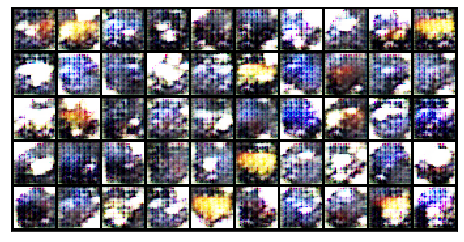

Epoch:61,   G_loss:6.128645975081647,    D_loss:0.3444695397600776
Epoch:62,   G_loss:5.427385863710622,    D_loss:0.4999616595259944
Epoch:63,   G_loss:4.987932349814743,    D_loss:0.40036624117342173
Epoch:64,   G_loss:5.507139049592565,    D_loss:0.3465645189900867
Epoch:65,   G_loss:6.427114103661209,    D_loss:0.36043908019534876
Epoch:66,   G_loss:5.020917689213987,    D_loss:0.3101287673487038
Epoch:67,   G_loss:5.866073721744975,    D_loss:0.26841636615820597
Epoch:68,   G_loss:5.577069208270213,    D_loss:0.31876911662641116
Epoch:69,   G_loss:5.101017862069802,    D_loss:0.30717776795146895


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:70,   G_loss:5.16249472586835,    D_loss:0.2547703266876643


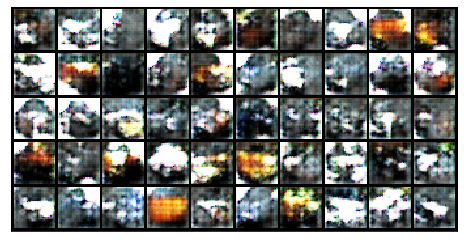

Epoch:71,   G_loss:4.995419271656724,    D_loss:0.4267515824100033
Epoch:72,   G_loss:4.905142834929169,    D_loss:0.30519788211486376
Epoch:73,   G_loss:5.852268797452332,    D_loss:0.3175005265740586
Epoch:74,   G_loss:5.652557892877548,    D_loss:0.31005382107295953
Epoch:75,   G_loss:5.540544431717669,    D_loss:0.3016213382609555
Epoch:76,   G_loss:5.932630695280482,    D_loss:0.3626040000407422
Epoch:77,   G_loss:5.405566086534594,    D_loss:0.2858033196115103
Epoch:78,   G_loss:5.16215618321153,    D_loss:0.2774534636467207
Epoch:79,   G_loss:5.5284756285245304,    D_loss:0.25367735949207526


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:80,   G_loss:5.071123314685509,    D_loss:0.2854893922072942


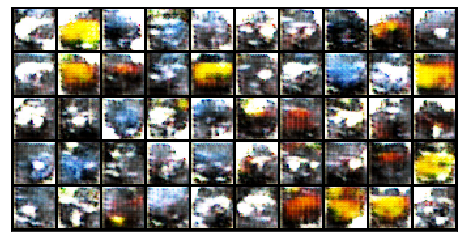

Epoch:81,   G_loss:5.938884273904269,    D_loss:0.22497454050500862
Epoch:82,   G_loss:6.197305245477645,    D_loss:0.3005063844630953
Epoch:83,   G_loss:5.900311481757242,    D_loss:0.28539392236070554
Epoch:84,   G_loss:6.172851871271602,    D_loss:0.23427432577018856
Epoch:85,   G_loss:6.235633646855589,    D_loss:0.3717134877672938
Epoch:86,   G_loss:6.103186290772235,    D_loss:0.2206097807979486
Epoch:87,   G_loss:5.719122675598645,    D_loss:0.19203617350488414
Epoch:88,   G_loss:6.4973172594289315,    D_loss:0.2089593043077554
Epoch:89,   G_loss:6.325106988187696,    D_loss:0.2582942696563045


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:90,   G_loss:5.965439194538554,    D_loss:0.2994718322927346


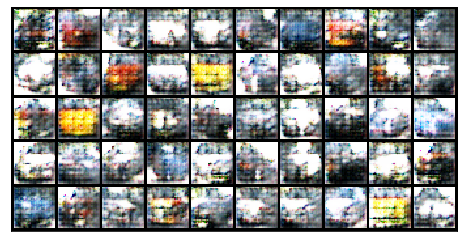

Epoch:91,   G_loss:5.980223401648099,    D_loss:0.22526962026098712
Epoch:92,   G_loss:5.838521640808856,    D_loss:0.2205152601370069
Epoch:93,   G_loss:5.654604681202622,    D_loss:0.21929241622202708
Epoch:94,   G_loss:5.450154253693878,    D_loss:0.15722545589030276
Epoch:95,   G_loss:5.447491720074513,    D_loss:0.1695663864251043
Epoch:96,   G_loss:6.09339638616218,    D_loss:0.17780448739096277
Epoch:97,   G_loss:6.187273392911817,    D_loss:0.17676345399412952
Epoch:98,   G_loss:5.863034017750474,    D_loss:0.23957080931448546
Epoch:99,   G_loss:6.382352723449957,    D_loss:0.2628136791410993


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:100,   G_loss:6.769597534273491,    D_loss:0.2748629741950846


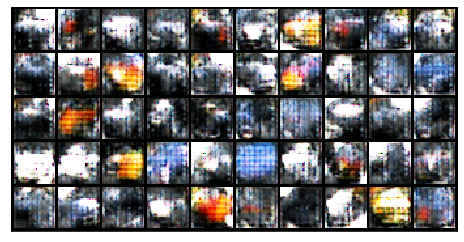

Epoch:101,   G_loss:7.196777418011525,    D_loss:0.1976725629714058
Epoch:102,   G_loss:6.601964710188693,    D_loss:0.23933669108683703
Epoch:103,   G_loss:6.357888006773151,    D_loss:0.2598108654750175
Epoch:104,   G_loss:6.237871267756478,    D_loss:0.23285944242274664
Epoch:105,   G_loss:6.321758575126773,    D_loss:0.22488767922413153
Epoch:106,   G_loss:6.42280396867971,    D_loss:0.18609740698832225
Epoch:107,   G_loss:6.38488763668498,    D_loss:0.22987363145488207
Epoch:108,   G_loss:6.648578565628802,    D_loss:0.22066538829783924
Epoch:109,   G_loss:7.422246749283837,    D_loss:0.2454801434803693


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:110,   G_loss:6.3838680454942045,    D_loss:0.3088306591952922


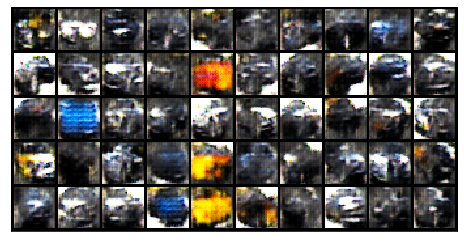

Epoch:111,   G_loss:5.991874741726234,    D_loss:0.28114163457248054
Epoch:112,   G_loss:6.40182680380149,    D_loss:0.24770039918481326
Epoch:113,   G_loss:6.1550673891286385,    D_loss:0.20744490373085755
Epoch:114,   G_loss:6.094751741065354,    D_loss:0.15619699932543224
Epoch:115,   G_loss:6.28339864777737,    D_loss:0.2331905883782711
Epoch:116,   G_loss:6.2705950228894345,    D_loss:0.262108098852952
Epoch:117,   G_loss:6.47757257789862,    D_loss:0.21231738648942258
Epoch:118,   G_loss:6.079565294453355,    D_loss:0.2061284011321478
Epoch:119,   G_loss:6.2861651358057244,    D_loss:0.21944323704257362


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:120,   G_loss:6.660015739378382,    D_loss:0.19387546209160422


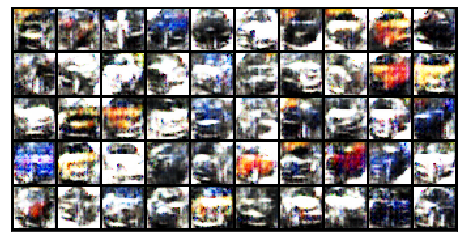

Epoch:121,   G_loss:6.328253863287753,    D_loss:0.2552428906630786
Epoch:122,   G_loss:6.237168198726216,    D_loss:0.27554798202558617
Epoch:123,   G_loss:6.745304224921054,    D_loss:0.24568369499117623
Epoch:124,   G_loss:6.008061721676686,    D_loss:0.2133993712238601
Epoch:125,   G_loss:6.805301400481677,    D_loss:0.17086795564801965
Epoch:126,   G_loss:6.1222295487513305,    D_loss:0.19604996081869133
Epoch:127,   G_loss:6.413041044454106,    D_loss:0.1917835390653278
Epoch:128,   G_loss:6.130671411264138,    D_loss:0.1661709971023632
Epoch:129,   G_loss:6.196247573758735,    D_loss:0.2078733190771986


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:130,   G_loss:6.580659795979985,    D_loss:0.14418016100821437


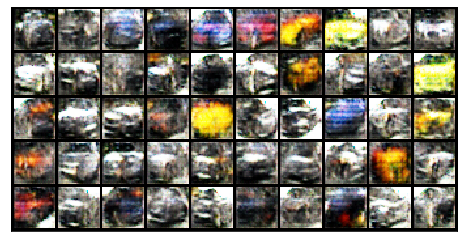

Epoch:131,   G_loss:6.499775835725128,    D_loss:0.15244506411712433
Epoch:132,   G_loss:6.624299956149742,    D_loss:0.17184165156767017
Epoch:133,   G_loss:6.397455234996608,    D_loss:0.1936329573576079
Epoch:134,   G_loss:5.903805380961934,    D_loss:0.144614755863049
Epoch:135,   G_loss:6.55643997817743,    D_loss:0.13606768730478208
Epoch:136,   G_loss:6.360124158077553,    D_loss:0.17726704316427472
Epoch:137,   G_loss:6.966216251498363,    D_loss:0.14151465404229085
Epoch:138,   G_loss:6.755744324355829,    D_loss:0.16094670501980382
Epoch:139,   G_loss:6.055714966820889,    D_loss:0.148003668631198


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:140,   G_loss:6.5799282652432804,    D_loss:0.1374593305661053


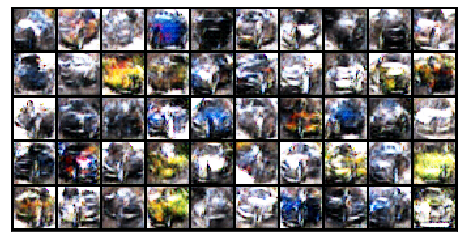

Epoch:141,   G_loss:6.4182053550345,    D_loss:0.1558393264097757
Epoch:142,   G_loss:6.519918238530393,    D_loss:0.18349484326775933
Epoch:143,   G_loss:6.94758122866271,    D_loss:0.1542881351025378
Epoch:144,   G_loss:6.676127547123393,    D_loss:0.21801404674827565
Epoch:145,   G_loss:7.076811356622665,    D_loss:0.1661788041810276
Epoch:146,   G_loss:6.995779858260859,    D_loss:0.1799283432392556
Epoch:147,   G_loss:7.158165157818403,    D_loss:0.17314852135958242
Epoch:148,   G_loss:6.338431741370529,    D_loss:0.15538583448553672
Epoch:149,   G_loss:7.1712111840482615,    D_loss:0.21549934957206981


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:150,   G_loss:6.529437850733272,    D_loss:0.20518952476807306


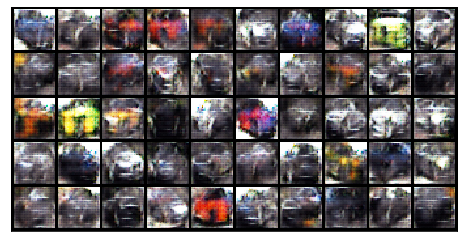

Epoch:151,   G_loss:6.415506362915039,    D_loss:0.13853607229033454
Epoch:152,   G_loss:6.2171052440268095,    D_loss:0.11953630096843985
Epoch:153,   G_loss:6.861527833782259,    D_loss:0.16443160467888
Epoch:154,   G_loss:7.056324470238607,    D_loss:0.21056081834020185
Epoch:155,   G_loss:6.587476472385594,    D_loss:0.188219444215542
Epoch:156,   G_loss:6.917565240234625,    D_loss:0.1859608716560436
Epoch:157,   G_loss:7.170049174887235,    D_loss:0.173219676786026
Epoch:158,   G_loss:7.001443890274548,    D_loss:0.12891447313939083
Epoch:159,   G_loss:6.496196250446507,    D_loss:0.147543668243118


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:160,   G_loss:6.8767477645248665,    D_loss:0.1478775514243934


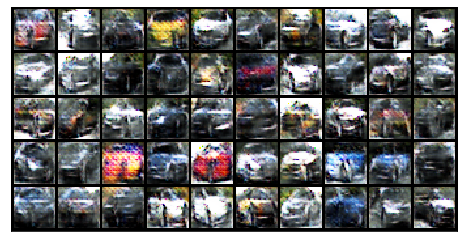

Epoch:161,   G_loss:6.956446342780942,    D_loss:0.1500986510444982
Epoch:162,   G_loss:7.045286811766077,    D_loss:0.1628274785995972
Epoch:163,   G_loss:6.743609623830826,    D_loss:0.13676645002159915
Epoch:164,   G_loss:6.435770507718696,    D_loss:0.157492833944862
Epoch:165,   G_loss:6.770072976096731,    D_loss:0.11384749719415044
Epoch:166,   G_loss:6.623496634061219,    D_loss:0.13984287412623403
Epoch:167,   G_loss:6.815750239325351,    D_loss:0.12840575845454072
Epoch:168,   G_loss:6.734386522261823,    D_loss:0.11179941961328026
Epoch:169,   G_loss:7.157432055864178,    D_loss:0.1483857946500915


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:170,   G_loss:7.100809742192753,    D_loss:0.1462329247447311


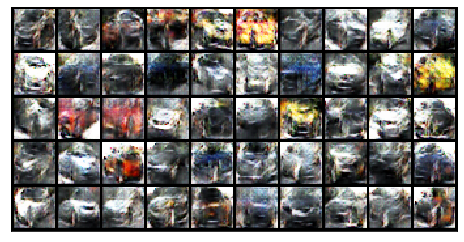

Epoch:171,   G_loss:7.211278336947082,    D_loss:0.2526465833843609
Epoch:172,   G_loss:7.426151971347997,    D_loss:0.19851350485057126
Epoch:173,   G_loss:6.991559302220579,    D_loss:0.14850744940187843
Epoch:174,   G_loss:6.918994727681895,    D_loss:0.15115876905009396
Epoch:175,   G_loss:7.18569462416602,    D_loss:0.1108380767104567
Epoch:176,   G_loss:6.525881052017212,    D_loss:0.13308245716158484
Epoch:177,   G_loss:7.148979949169472,    D_loss:0.12482274129040173
Epoch:178,   G_loss:6.836102489565239,    D_loss:0.1169909311030976
Epoch:179,   G_loss:6.719376184901253,    D_loss:0.10949582493573916


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:180,   G_loss:7.331738808115975,    D_loss:0.20675642692224414


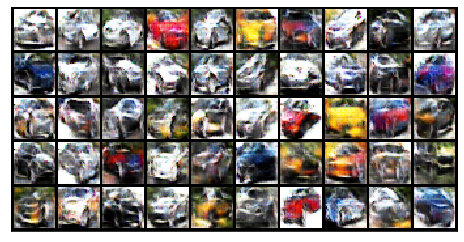

Epoch:181,   G_loss:7.280820815289607,    D_loss:0.19643743524755367
Epoch:182,   G_loss:6.941251954094309,    D_loss:0.17728996731829447
Epoch:183,   G_loss:7.07674527559124,    D_loss:0.17275630053682406
Epoch:184,   G_loss:7.4421529300877305,    D_loss:0.16449593294595108
Epoch:185,   G_loss:6.987347133824082,    D_loss:0.16049998445955457
Epoch:186,   G_loss:6.877002700430448,    D_loss:0.1158851154576071
Epoch:187,   G_loss:7.054886180846418,    D_loss:0.1410250517799229
Epoch:188,   G_loss:6.774864302306879,    D_loss:0.11688182417486535
Epoch:189,   G_loss:7.057678965271497,    D_loss:0.11532007747131293


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:190,   G_loss:6.710454053566104,    D_loss:0.10107588793960262


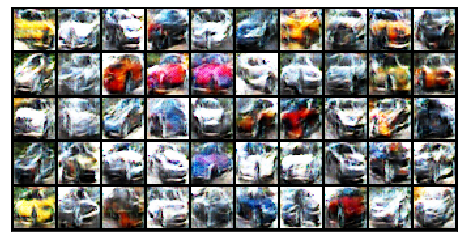

Epoch:191,   G_loss:6.63979266119785,    D_loss:0.12098366125929551
Epoch:192,   G_loss:6.993617737879519,    D_loss:0.14542430437734868
Epoch:193,   G_loss:7.068744940835922,    D_loss:0.18435944482439853
Epoch:194,   G_loss:7.3016506101264325,    D_loss:0.13141117883143855
Epoch:195,   G_loss:6.991267599043299,    D_loss:0.1460264971571379
Epoch:196,   G_loss:7.519787041867366,    D_loss:0.1364582212275413
Epoch:197,   G_loss:7.238921798643519,    D_loss:0.11734268869288632
Epoch:198,   G_loss:6.773788287991383,    D_loss:0.0943242998213553
Epoch:199,   G_loss:7.094304843027084,    D_loss:0.0922209591467361


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:200,   G_loss:6.774484911903006,    D_loss:0.13461120451846328


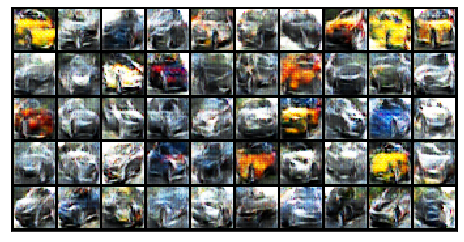

Epoch:201,   G_loss:7.161219804013362,    D_loss:0.12331960968612159
Epoch:202,   G_loss:7.353825975636967,    D_loss:0.1450091153230579
Epoch:203,   G_loss:7.241001234679926,    D_loss:0.1522458168815394
Epoch:204,   G_loss:7.288416112055544,    D_loss:0.1400947616450855
Epoch:205,   G_loss:7.418300527041076,    D_loss:0.18835154928450212
Epoch:206,   G_loss:7.46017665550357,    D_loss:0.17110932134397205
Epoch:207,   G_loss:7.838506690791396,    D_loss:0.21655952046457372
Epoch:208,   G_loss:7.548715599247666,    D_loss:0.17371394376835372
Epoch:209,   G_loss:7.229028420370133,    D_loss:0.13978756664198685


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:210,   G_loss:7.472771320186678,    D_loss:0.15751516452196557


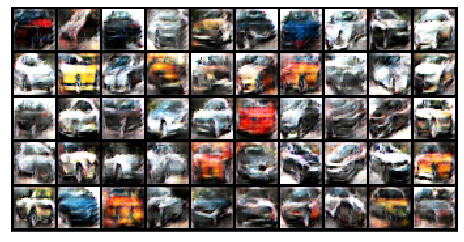

Epoch:211,   G_loss:7.1532584761009845,    D_loss:0.13528574692451809
Epoch:212,   G_loss:6.852549291047894,    D_loss:0.10720650492938327
Epoch:213,   G_loss:7.442049542411429,    D_loss:0.12820355656755264
Epoch:214,   G_loss:7.530026256060991,    D_loss:0.12280665325825332
Epoch:215,   G_loss:7.393329694622853,    D_loss:0.16039333145179954
Epoch:216,   G_loss:7.758471301344574,    D_loss:0.11246551568696245
Epoch:217,   G_loss:7.404869056138836,    D_loss:0.10076100519690358
Epoch:218,   G_loss:6.997309211824761,    D_loss:0.1203365606087886
Epoch:219,   G_loss:7.134681932261733,    D_loss:0.11798185066579552


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:220,   G_loss:7.8357881053549345,    D_loss:0.13135977227576687


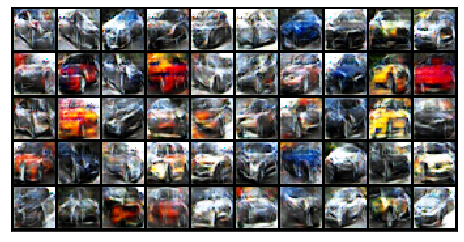

Epoch:221,   G_loss:6.838818460214333,    D_loss:0.0815544921187226
Epoch:222,   G_loss:7.593713228819801,    D_loss:0.11839524769132621
Epoch:223,   G_loss:7.369138264265216,    D_loss:0.10666732212192699
Epoch:224,   G_loss:7.331467003118797,    D_loss:0.16499608312733471
Epoch:225,   G_loss:7.3498061993083015,    D_loss:0.1310203887797037
Epoch:226,   G_loss:7.775820044220471,    D_loss:0.12100801621487395
Epoch:227,   G_loss:7.581508132277942,    D_loss:0.1112378329405042
Epoch:228,   G_loss:7.808936025275559,    D_loss:0.12009482586481532
Epoch:229,   G_loss:7.818225727706659,    D_loss:0.11835112289495034


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:230,   G_loss:6.896303489559987,    D_loss:0.1205306270342992


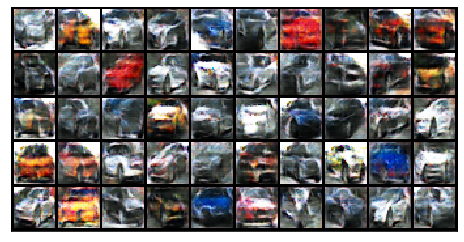

Epoch:231,   G_loss:7.563389770320205,    D_loss:0.11927762978756037
Epoch:232,   G_loss:7.24412802790032,    D_loss:0.11959968136287615
Epoch:233,   G_loss:7.502813276697378,    D_loss:0.14179504439082058
Epoch:234,   G_loss:7.465105471063833,    D_loss:0.11488400571445218
Epoch:235,   G_loss:7.821142227923284,    D_loss:0.09327386413532936
Epoch:236,   G_loss:7.571863745079666,    D_loss:0.1287415011511108
Epoch:237,   G_loss:7.530301719415383,    D_loss:0.13136993110424183
Epoch:238,   G_loss:7.41299753501767,    D_loss:0.14180722437249343
Epoch:239,   G_loss:7.057562409854326,    D_loss:0.12601133652000887


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:240,   G_loss:7.705216548481926,    D_loss:0.10201053031277461


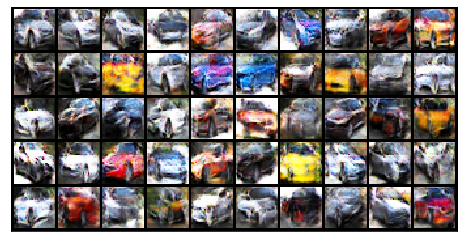

Epoch:241,   G_loss:7.740510408995582,    D_loss:0.11110342568794235
Epoch:242,   G_loss:7.306600195462586,    D_loss:0.11550407443714679
Epoch:243,   G_loss:7.648705396495882,    D_loss:0.12522605433296718
Epoch:244,   G_loss:7.933523482963687,    D_loss:0.09324820540448436
Epoch:245,   G_loss:7.751278322251117,    D_loss:0.0900777063149287
Epoch:246,   G_loss:7.716040923947194,    D_loss:0.11840277852215728
Epoch:247,   G_loss:7.119756815863437,    D_loss:0.11031371003902349
Epoch:248,   G_loss:7.385270409896726,    D_loss:0.11050045277282107
Epoch:249,   G_loss:7.404164732479658,    D_loss:0.09840995603103618


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:250,   G_loss:7.377895667904713,    D_loss:0.0826281997237782


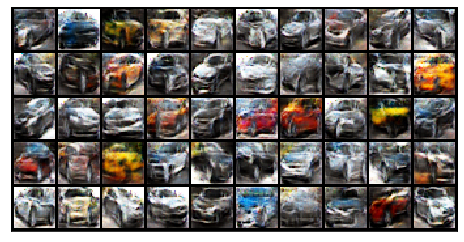

Epoch:251,   G_loss:7.728701153739554,    D_loss:0.08685122124972891
Epoch:252,   G_loss:7.232121631747386,    D_loss:0.07482140685324787
Epoch:253,   G_loss:6.841242563529093,    D_loss:0.0823906373202068
Epoch:254,   G_loss:7.674929579750437,    D_loss:0.07945830407781435
Epoch:255,   G_loss:7.49701198984365,    D_loss:0.08148845814962367
Epoch:256,   G_loss:7.4645968030710685,    D_loss:0.0763248845965403
Epoch:257,   G_loss:7.9300170804633465,    D_loss:0.08520682916411611
Epoch:258,   G_loss:8.319472531803319,    D_loss:0.15269491892521742
Epoch:259,   G_loss:8.323062947539032,    D_loss:0.18704939322912548


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:260,   G_loss:8.753002491153655,    D_loss:0.23651456163402218


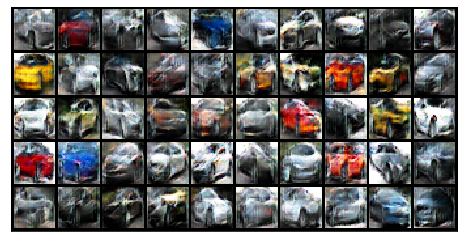

Epoch:261,   G_loss:8.230029966010422,    D_loss:0.1905303751347495
Epoch:262,   G_loss:8.173973712764802,    D_loss:0.15706274566072664
Epoch:263,   G_loss:8.052560266901235,    D_loss:0.11091887734860914
Epoch:264,   G_loss:8.223554220355926,    D_loss:0.131555653864243
Epoch:265,   G_loss:7.6050544566795475,    D_loss:0.10086362576112151
Epoch:266,   G_loss:7.987893284344282,    D_loss:0.1176889297689815
Epoch:267,   G_loss:7.280058720072762,    D_loss:0.10139508082027562
Epoch:268,   G_loss:7.133659440962995,    D_loss:0.07916228649527078
Epoch:269,   G_loss:8.181987864072205,    D_loss:0.10149341659070771


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:270,   G_loss:7.424595051124448,    D_loss:0.08271182798704163


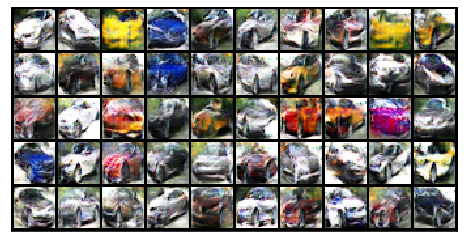

Epoch:271,   G_loss:6.7962097261772785,    D_loss:0.06240826009268888
Epoch:272,   G_loss:7.042417178388502,    D_loss:0.0820680992815216
Epoch:273,   G_loss:8.004554803254175,    D_loss:0.11162643494145548
Epoch:274,   G_loss:7.320074425369013,    D_loss:0.093717345448791
Epoch:275,   G_loss:8.34453754737729,    D_loss:0.10753546052108534
Epoch:276,   G_loss:7.58877070614549,    D_loss:0.10233194811544458
Epoch:277,   G_loss:7.435993186763076,    D_loss:0.0832293865072434
Epoch:278,   G_loss:7.560373865190099,    D_loss:0.1102483359883066
Epoch:279,   G_loss:7.748659470042244,    D_loss:0.07590232520806985


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:280,   G_loss:8.068445659074627,    D_loss:0.08898614377897905


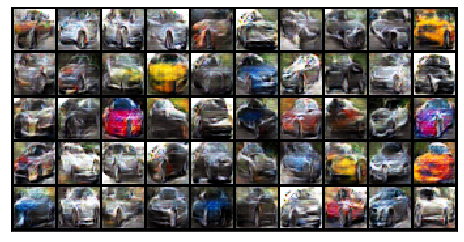

Epoch:281,   G_loss:7.652055154081251,    D_loss:0.07227482527234881
Epoch:282,   G_loss:8.130283723112013,    D_loss:0.09680066264585638
Epoch:283,   G_loss:8.585619629406539,    D_loss:0.11524881502483651
Epoch:284,   G_loss:8.745463222753806,    D_loss:0.1257017892251005
Epoch:285,   G_loss:7.947815086020798,    D_loss:0.10366177463476531
Epoch:286,   G_loss:8.150244278985946,    D_loss:0.1769662564391362
Epoch:287,   G_loss:7.948226021938637,    D_loss:0.09234464715128063
Epoch:288,   G_loss:7.869118268372582,    D_loss:0.08974140335912587
Epoch:289,   G_loss:8.088974256984523,    D_loss:0.07895801366749601


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:290,   G_loss:7.88942898296919,    D_loss:0.07101003399698949


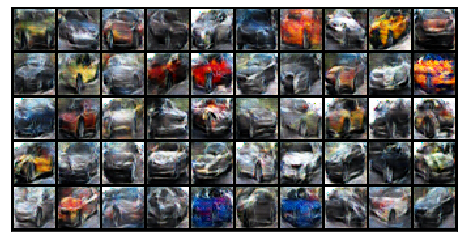

Epoch:291,   G_loss:7.363583361516233,    D_loss:0.06668940729263131
Epoch:292,   G_loss:7.6491882527460815,    D_loss:0.06546039213655425
Epoch:293,   G_loss:8.045084992393118,    D_loss:0.05870140981898628
Epoch:294,   G_loss:7.538176825789154,    D_loss:0.0487929887947489
Epoch:295,   G_loss:7.975110186905157,    D_loss:0.05428905854551274
Epoch:296,   G_loss:7.930964079059538,    D_loss:0.0668764951654145
Epoch:297,   G_loss:8.20407205331521,    D_loss:0.08433727696003607
Epoch:298,   G_loss:8.542281385327948,    D_loss:0.11216752940681993
Epoch:299,   G_loss:8.83101614186021,    D_loss:0.08969700874638606


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:300,   G_loss:8.057680348880956,    D_loss:0.10322538297241707


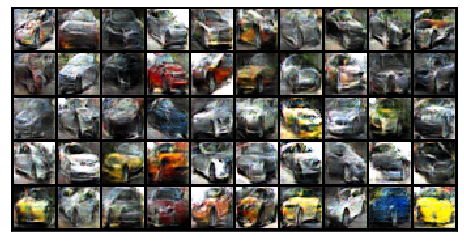

Epoch:301,   G_loss:8.178516763155578,    D_loss:0.08521566381219958
Epoch:302,   G_loss:8.3754825513871,    D_loss:0.07966286712707799
Epoch:303,   G_loss:8.192404707924265,    D_loss:0.09532033023806136
Epoch:304,   G_loss:8.988175399967881,    D_loss:0.11913110889097461
Epoch:305,   G_loss:7.487146197772417,    D_loss:0.08325606634550285
Epoch:306,   G_loss:8.097888258636974,    D_loss:0.09916628287250145
Epoch:307,   G_loss:7.853429082964287,    D_loss:0.06535034519944675
Epoch:308,   G_loss:8.572430110368572,    D_loss:0.07456504741729406
Epoch:309,   G_loss:8.58629973208318,    D_loss:0.06996365478185967


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:310,   G_loss:8.206347223188056,    D_loss:0.08084891255960235


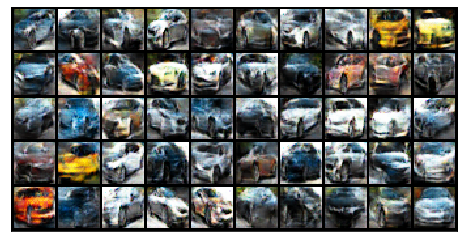

Epoch:311,   G_loss:8.516548320895335,    D_loss:0.06803108425047553
Epoch:312,   G_loss:8.030418138035008,    D_loss:0.07159544738223318
Epoch:313,   G_loss:8.218259272028188,    D_loss:0.0641355204976118
Epoch:314,   G_loss:8.730502292758128,    D_loss:0.07933435899770407
Epoch:315,   G_loss:8.446545217857986,    D_loss:0.05861718741199765
Epoch:316,   G_loss:7.880091909502373,    D_loss:0.055479034888329073
Epoch:317,   G_loss:8.61867950001701,    D_loss:0.10641452872392829
Epoch:318,   G_loss:8.72535274067863,    D_loss:0.13695891530130852
Epoch:319,   G_loss:8.939569633515156,    D_loss:0.1561901136301458


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:320,   G_loss:8.298449062910237,    D_loss:0.1608113270695703


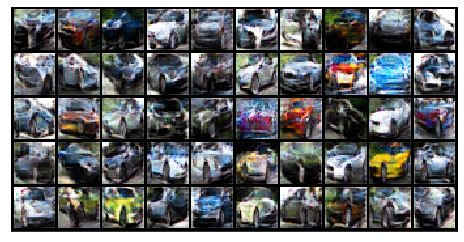

Epoch:321,   G_loss:8.542620658874512,    D_loss:0.1552872703120601
Epoch:322,   G_loss:8.69137535720575,    D_loss:0.1309061244408768
Epoch:323,   G_loss:8.407910260997834,    D_loss:0.09669093538045151
Epoch:324,   G_loss:8.324471118020229,    D_loss:0.11935780614186994
Epoch:325,   G_loss:9.153741848273356,    D_loss:0.14367055129183487
Epoch:326,   G_loss:8.74753665142372,    D_loss:0.12356121172426177
Epoch:327,   G_loss:7.655681547571401,    D_loss:0.06183970658505549
Epoch:328,   G_loss:9.146555560534118,    D_loss:0.07935868767777184
Epoch:329,   G_loss:8.492343488286753,    D_loss:0.0827887252385377


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:330,   G_loss:7.973333765248784,    D_loss:0.06251956048406294


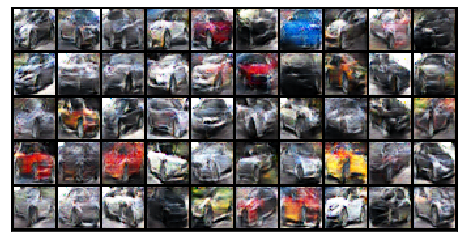

Epoch:331,   G_loss:8.009110560182664,    D_loss:0.05506153492119591
Epoch:332,   G_loss:8.070186747879278,    D_loss:0.03265492592129062
Epoch:333,   G_loss:8.815070003759665,    D_loss:0.08197634836628301
Epoch:334,   G_loss:8.468612319133321,    D_loss:0.0454496519571384
Epoch:335,   G_loss:8.376362495735043,    D_loss:0.057174963529267514
Epoch:336,   G_loss:8.10295642008547,    D_loss:0.033396227220378695
Epoch:337,   G_loss:8.702776049004227,    D_loss:0.03716437650661244
Epoch:338,   G_loss:8.142586371937735,    D_loss:0.03922815935029725
Epoch:339,   G_loss:8.546020757956583,    D_loss:0.027360769317935785


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:340,   G_loss:8.178894590158931,    D_loss:0.041482033841617284


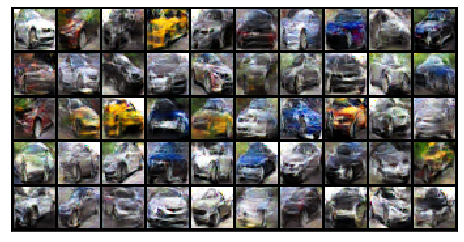

Epoch:341,   G_loss:8.317528974814493,    D_loss:0.034997715046018604
Epoch:342,   G_loss:8.18457139906336,    D_loss:0.02863600241310406
Epoch:343,   G_loss:8.608092050083348,    D_loss:0.028039447654069204
Epoch:344,   G_loss:8.571517600387823,    D_loss:0.03488327488570367
Epoch:345,   G_loss:8.260579656382076,    D_loss:0.0356724084103022
Epoch:346,   G_loss:9.366171899389048,    D_loss:0.09348622807225243
Epoch:347,   G_loss:8.605878822139053,    D_loss:0.09500752660430602
Epoch:348,   G_loss:9.580345122540583,    D_loss:0.08485221638359496
Epoch:349,   G_loss:9.591256555963735,    D_loss:0.1543547597000009


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:350,   G_loss:9.875109281696258,    D_loss:0.20320483423830543


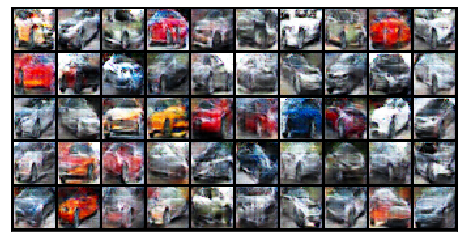

Epoch:351,   G_loss:10.336813168447526,    D_loss:0.24272645044438235
Epoch:352,   G_loss:9.842364295584257,    D_loss:0.2825982617366998
Epoch:353,   G_loss:8.24147638727407,    D_loss:0.15472635405412952
Epoch:354,   G_loss:8.896015104700307,    D_loss:0.1355246729790004
Epoch:355,   G_loss:8.176789283752441,    D_loss:0.10578181886221052
Epoch:356,   G_loss:7.863574504852295,    D_loss:0.0593792265471926
Epoch:357,   G_loss:8.368630315436691,    D_loss:0.07005953590469588
Epoch:358,   G_loss:8.424454411522287,    D_loss:0.0658242429003547
Epoch:359,   G_loss:8.515304948462814,    D_loss:0.04776795898930582


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:360,   G_loss:8.070581092209112,    D_loss:0.04958623859909226


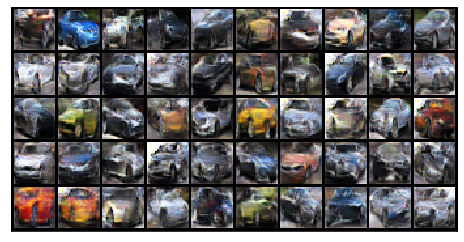

Epoch:361,   G_loss:7.861216177705859,    D_loss:0.04401340644776088
Epoch:362,   G_loss:8.393960702614706,    D_loss:0.04123657682269323
Epoch:363,   G_loss:8.6803949074667,    D_loss:0.03648822029792994
Epoch:364,   G_loss:7.981061833803771,    D_loss:0.044612290852962706
Epoch:365,   G_loss:8.281203559187592,    D_loss:0.03062472122217544
Epoch:366,   G_loss:8.054859552227082,    D_loss:0.03519500380565153
Epoch:367,   G_loss:8.459560253581063,    D_loss:0.028010919688223692
Epoch:368,   G_loss:8.774201619820516,    D_loss:0.0322359884921156
Epoch:369,   G_loss:8.999389304489386,    D_loss:0.039801438505089555


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:370,   G_loss:8.93492950376917,    D_loss:0.05678777756612198


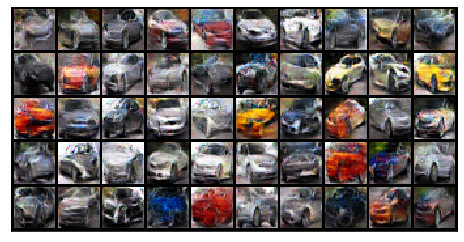

Epoch:371,   G_loss:9.457023065598285,    D_loss:0.08532994319150439
Epoch:372,   G_loss:9.184920654922236,    D_loss:0.09838542026147003
Epoch:373,   G_loss:8.444068056638123,    D_loss:0.0712017997847412
Epoch:374,   G_loss:9.323952885924793,    D_loss:0.08680166562897015
Epoch:375,   G_loss:9.92746868289885,    D_loss:0.08300688925206845
Epoch:376,   G_loss:8.601242510998835,    D_loss:0.10050108131845711
Epoch:377,   G_loss:9.263920268074411,    D_loss:0.08554211803940964
Epoch:378,   G_loss:9.4315318201409,    D_loss:0.09672885607225729
Epoch:379,   G_loss:9.387616595283884,    D_loss:0.1052979925975631


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:380,   G_loss:9.276918434705891,    D_loss:0.07082765010380201


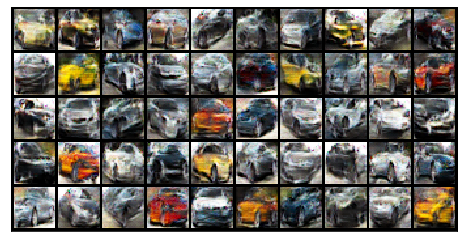

Epoch:381,   G_loss:8.700427891778164,    D_loss:0.09504179964147386
Epoch:382,   G_loss:8.477300057645705,    D_loss:0.0321644602837728
Epoch:383,   G_loss:9.002355575561523,    D_loss:0.058560725965644
Epoch:384,   G_loss:8.824733968640937,    D_loss:0.036074777467741216
Epoch:385,   G_loss:8.708817411641606,    D_loss:0.054851011397912486
Epoch:386,   G_loss:8.772947827323538,    D_loss:0.03802686296288901
Epoch:387,   G_loss:8.759464443707076,    D_loss:0.03117309923314291
Epoch:388,   G_loss:8.304718439696265,    D_loss:0.031711871201386216
Epoch:389,   G_loss:8.331998723452209,    D_loss:0.02724282619863993


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:390,   G_loss:8.923257522895687,    D_loss:0.024111124057108996


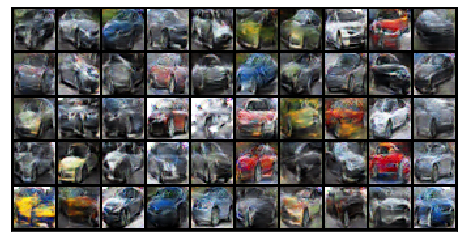

Epoch:391,   G_loss:8.698126581848644,    D_loss:0.016501895908731967
Epoch:392,   G_loss:8.805017033561331,    D_loss:0.032166065667282605
Epoch:393,   G_loss:8.4577106256954,    D_loss:0.013566991821939095
Epoch:394,   G_loss:9.091073716273073,    D_loss:0.03310778150411292
Epoch:395,   G_loss:8.782385919914871,    D_loss:0.026434083292680623
Epoch:396,   G_loss:9.008622130409616,    D_loss:0.037061150838453016
Epoch:397,   G_loss:9.410272547456085,    D_loss:0.15287101526599622
Epoch:398,   G_loss:9.517552242904413,    D_loss:0.19746590017142598
Epoch:399,   G_loss:10.147466659545898,    D_loss:0.14626564380911286


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:400,   G_loss:10.216634594026159,    D_loss:0.20452911245300756


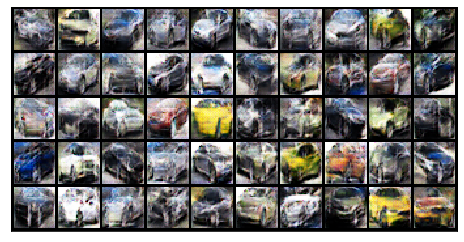

Epoch:401,   G_loss:9.804991425060836,    D_loss:0.10754873127997165
Epoch:402,   G_loss:9.173195205751012,    D_loss:0.09531197271340328
Epoch:403,   G_loss:10.031321939874868,    D_loss:0.08064715770172474
Epoch:404,   G_loss:8.513695286922767,    D_loss:0.08193217087956908
Epoch:405,   G_loss:9.843285537156902,    D_loss:0.07266993185154116
Epoch:406,   G_loss:8.731842650741827,    D_loss:0.06461716815065897
Epoch:407,   G_loss:8.98201542995015,    D_loss:0.061593416255715565
Epoch:408,   G_loss:9.236377669162438,    D_loss:0.04384648112854997
Epoch:409,   G_loss:8.306090245481398,    D_loss:0.03354502472259318


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:410,   G_loss:8.811637002913677,    D_loss:0.03465007773035618


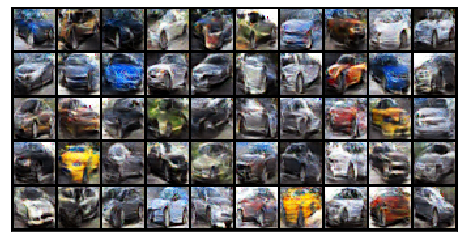

Epoch:411,   G_loss:8.758035503449987,    D_loss:0.028881054802904607
Epoch:412,   G_loss:8.596323880992951,    D_loss:0.036935130685766336
Epoch:413,   G_loss:8.477265357971191,    D_loss:0.029400632188075267
Epoch:414,   G_loss:8.741530238604936,    D_loss:0.02818719732773597
Epoch:415,   G_loss:8.547428318711578,    D_loss:0.03478654574595209
Epoch:416,   G_loss:9.294078287531118,    D_loss:0.0464791745256602
Epoch:417,   G_loss:9.738587825024714,    D_loss:0.04862674204327288
Epoch:418,   G_loss:9.610106569821717,    D_loss:0.07636162927030724
Epoch:419,   G_loss:9.813943182835814,    D_loss:0.07115360844086428


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:420,   G_loss:9.530373948519347,    D_loss:0.0709576893809679


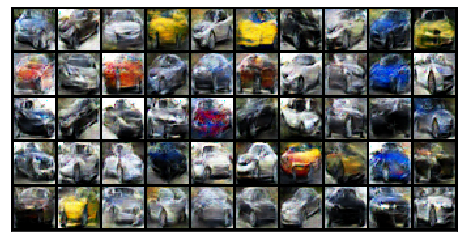

Epoch:421,   G_loss:8.93098889022577,    D_loss:0.07357939659831587
Epoch:422,   G_loss:9.791744662112878,    D_loss:0.07193541333277817
Epoch:423,   G_loss:9.280032470578053,    D_loss:0.10464460722964684
Epoch:424,   G_loss:9.79565040400771,    D_loss:0.06976208451574241
Epoch:425,   G_loss:9.471026342423237,    D_loss:0.05966030411254309
Epoch:426,   G_loss:8.738847318242808,    D_loss:0.037255738482077715
Epoch:427,   G_loss:9.704049860844847,    D_loss:0.07024644749414664
Epoch:428,   G_loss:9.910648642993364,    D_loss:0.06952177130590483
Epoch:429,   G_loss:9.17201211022549,    D_loss:0.05070471440701455


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:430,   G_loss:9.479798731256704,    D_loss:0.0637970556119518


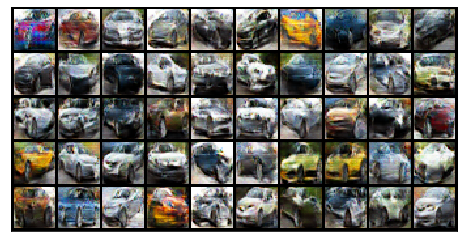

Epoch:431,   G_loss:9.773107466150503,    D_loss:0.04840006165924009
Epoch:432,   G_loss:9.683275543275427,    D_loss:0.0527424253256167
Epoch:433,   G_loss:9.34920717458256,    D_loss:0.041939625331414404
Epoch:434,   G_loss:9.014693518153956,    D_loss:0.03436249296074031
Epoch:435,   G_loss:10.083621017268447,    D_loss:0.043487040196224805
Epoch:436,   G_loss:9.005617509122755,    D_loss:0.0315349342408361
Epoch:437,   G_loss:8.870264952300024,    D_loss:0.023610922030829748
Epoch:438,   G_loss:9.42745318959971,    D_loss:0.020161647518493662
Epoch:439,   G_loss:9.547560418238405,    D_loss:0.0214122064930738


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:440,   G_loss:9.943854832258381,    D_loss:0.04010967854753931


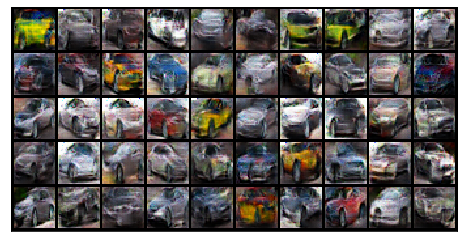

Epoch:441,   G_loss:10.113955263231622,    D_loss:0.07796543251654348
Epoch:442,   G_loss:10.279295772802634,    D_loss:0.11186009273314695
Epoch:443,   G_loss:10.019088596594138,    D_loss:0.08939595922797186
Epoch:444,   G_loss:10.541901002164748,    D_loss:0.12640774260717827
Epoch:445,   G_loss:10.333063328852418,    D_loss:0.11693186397315003
Epoch:446,   G_loss:9.903154224645895,    D_loss:0.11162524714256775


In [ ]:
#G_loss_epoch = []
#D_loss_epoch = []
total_epochs = 500
for epoch in range(total_epochs):
    G_loss_run = 0.0
    D_loss_run = 0.0
    
    for i, data in enumerate(train_loader):
        X, _ = data
        #X = X.view(X.size(0), -1)
        mb_size = X.size(0)
        
        one_labels = torch.ones(mb_size, 1, 1, 1)
        zero_labels = torch.zeros(mb_size, 1, 1, 1)
        
        z = torch.randn(mb_size, nz, 1 , 1)
        

        D_real = D(X)
        D_fake = D(G(z))

        D_real_loss = F.binary_cross_entropy(D_real, one_labels)  #loss -(1/m)(log D(x))
        D_fake_loss = F.binary_cross_entropy(D_fake, zero_labels)  #loss -(1/m)(log(1-D(G(z))))
        D_loss = D_real_loss + D_fake_loss
        
        d_opt.zero_grad()
        D_loss.backward()
        d_opt.step()
        
        z = torch.randn(mb_size, nz, 1, 1)
        
        D_fake = D(G(z))
        G_loss = F.binary_cross_entropy(D_fake, one_labels)  #loss -(1/m)(log (1-D(G(z))))
        
        g_opt.zero_grad()
        G_loss.backward()
        g_opt.step()
        
        G_loss_run += G_loss.item()
        D_loss_run += D_loss.item()

        #print("Batch: %d" %i)
        
    print('Epoch:{},   G_loss:{},    D_loss:{}'.format(epoch, G_loss_run/(i+1), D_loss_run/(i+1)))
    G_loss_epoch.append(G_loss_run/(i+1))
    D_loss_epoch.append(D_loss_run/(i+1))
    
    

    if(epoch%10 == 0):
        # priting a sample of 16 images by gan
        samples = G(torch.randn(50, nz, 1, 1)).detach()
        samples = samples.view(samples.size(0), 3, 32, 32)
        imshow(samples, epoch)

ValueError: x and y must have same first dimension, but have shapes (500,) and (0,)

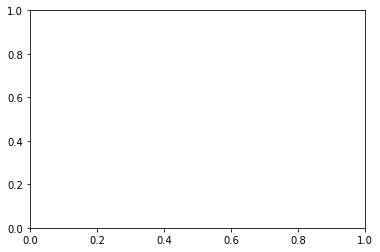

In [13]:
# Printing plots of Generator and Discriminiator error with epochs
plt.plot(range(1,total_epochs+1), G_loss_epoch, D_loss_epoch)
plt.ylabel("Loss")
plt.xlabel("Epochs")
plt.title("Losses vs Training Epochs")
plt.legend(("Generator Loss", "Discriminiator Loss"))
plt.savefig("Loss_vs_Epochs.png")